# Week 9 - Multivariate Analysis, part 2

# Imports

In [15]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt 
import kagglehub 

from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
%matplotlib inline
from kagglehub              import KaggleDatasetAdapter
from imblearn.over_sampling import SMOTE

sns.set(font_scale=0.8) 
# plt.rcParams['figure.figsize'] = (8, 4)
plt.rcParams['axes.titlesize']  = 10
plt.rcParams['axes.labelsize']  = 8
plt.rcParams['lines.linewidth'] = 0.5
# plt.rcParams['lines.markersize'] = 3
plt.rcParams['axes.edgecolor']  = 'gray'
plt.rcParams['xtick.color']     = 'gray'
plt.rcParams['ytick.color'] = 'gray'
plt.rcParams['xtick.color'] = 'gray'
plt.rcParams['ytick.color'] = 'gray'
plt.rcParams['ytick.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 8


### Global variables
test_size = 0.2
random_state = 42

# My functions

In [16]:
# add optional ax parameter to allow for custom axes
def get_correl_matrix(df, dataset_name = None, colormap = 'coolwarm', data_labels = True, method = 'pearson', figsize = (14, 10), ax=None):
    corr_matrix = df.corr()

    # Create mask for upper triangle
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

    # Plot heatmap
    if ax is None:
        plt.figure(figsize = figsize)
        ax = plt.gca()

    # annotation_kwargs = {"size": 8} # You can adjust this number
    sns.set_theme(font_scale=0.8)  # Adjust font size for better readability
    sns.heatmap(corr_matrix, annot = data_labels, fmt=".2f", cmap = colormap, linewidths = .5, square=True, mask=mask, cbar_kws={"shrink": .8}, ax=ax)
    ax.set_title(f'Correlation Matrix: ' + (f'{dataset_name}' if dataset_name else ''), fontsize=12)
    plt.show()

In [17]:

def plot_bubble(df, x_col, y_col, size_col, color_col = None, s = None, alpha = 0.6, figsize = (8, 4)):
    plt.figure(figsize = figsize)

    scatter = plt.scatter(
        df[x_col], df[y_col],
        s           = df[size_col] * 10 if s is None else s,  # scale bubble size
        c           = df[color_col],
        cmap        = 'coolwarm',
        alpha       = alpha,
        edgecolors  = 'w',
        linewidth   = 0.5
    )
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.title(f'{y_col} vs {x_col} (size: {size_col})')
    plt.colorbar(scatter, label = color_col)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [18]:

def plot_bubble_subplot(ax, df, x_col, y_col, size_col, color_col = 'Diagnosis', s = None, alpha = 0.6):
    scatter = ax.scatter(
        df[x_col], df[y_col],
        s           = df[size_col] * 10 if s is None else s,  # scale bubble size
        c           = df[color_col],
        cmap        = 'coolwarm',
        alpha       = alpha,
        edgecolors  = 'w',
        linewidth   = 0.5
    )
    ax.set_xlabel(x_col)
    ax.set_ylabel(y_col)
    ax.set_title(f'{y_col} vs {x_col}\n(size: {size_col})')
    ax.grid(True)
    return scatter


In [19]:

def run_pca_analysis(df, features, dataset_name, target_col):
    # Drop missing values and scale features
    df_clean = df[features + [target_col]].dropna()
    X_scaled = StandardScaler().fit_transform(df_clean[features])

    pca             = PCA()
    X_pca           = pca.fit_transform(X_scaled)
    explained_var   = pca.explained_variance_ratio_

    # Plot cumulative and individual explained variance
    plt.figure(figsize=(8, 5))
    plt.plot(range(1, len(explained_var)+1), np.cumsum(explained_var), marker='o',markersize=3, linestyle='--', label='Cumulative Explained Variance')
    plt.plot(range(1, len(explained_var)+1), explained_var, marker='x', linestyle='-', markersize = 3, label='Individual Explained Variance')
    plt.axhline(y=0.90, color='red', linestyle='--', label='90% Threshold')
    plt.title(f'Cumul. & Indiv. Variance Explained - {dataset_name}')
    plt.xlabel('Number of Principal Components')
    plt.ylabel('Explained Variance')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Create PCA DataFrame with first two components and target column
    pca_df = pd.DataFrame(X_pca[:, :2], columns=['PC1', 'PC2'])
    pca_df[target_col] = df_clean[target_col].values

    # Scatter plot with hue based on target column
    plt.figure(figsize=(6, 4))
    sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue=target_col, alpha=0.5, s=30, palette='viridis')
    plt.title(f'{dataset_name}: PCA Projection (First 2 PCs)')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Print variance explained by first principal component
    print(f"{dataset_name}:\nFirst PC explains {explained_var[0]:.2%} of variance")
    print(f"Total Variance Explained by First 2 PCs: {explained_var[:2].sum():.2%}")
    return pca_df, explained_var


In [20]:


def run_regression_task(df, features, target, numeric_cols, test_size = 0.2, random_state = 42):
    # Filter valid features
    features = [f for f in features if f in df.columns and f in numeric_cols]
    if target not in df.columns or target not in numeric_cols:
        print(f"Warning: Target variable '{target}' is not valid.")
        return None

    if not features:
        print(f"Warning: No valid features found for predicting {target}. Skipping this regression task.")
        return None

    # Prepare data
    X = df[features]
    y = df[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Train model
    model   = LinearRegression()
    model.fit(X_train, y_train)
    y_pred  = model.predict(X_test)

    # Evaluation metrics
    r2  = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)

    # Print results
    print(f"\n--- Regression Task: Predict {target} ---")
    print(f"R-squared: {r2:.4f}")
    print(f"Mean Squared Error: {mse:.4f}")
    print("Coefficients:")
    for feature, coef in zip(features, model.coef_):
        print(f"  {feature}: {coef:.4f}")
    print(f"Intercept: {model.intercept_:.4f}")

    # Plot actual vs predicted
    plt.figure(figsize = (6, 4))
    plt.scatter(y_test, y_pred, alpha = 0.5, color = 'midnightblue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
    plt.xlabel(f'Actual')
    plt.ylabel(f'Predicted')
    plt.title(f' {target}: Actual vs Predicted')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Store results
    results = {
        'target': target,
        'features': features,
        'r_squared': r2,
        'mse': mse,
        'coefficients': dict(zip(features, model.coef_)),
        'intercept': model.intercept_,
        'y_test': y_test,
        'y_pred': y_pred
    }

    return results



# 1. Lesson - no lesson this week

# 2. Weekly graph question

The graph below plots the first two principal component scores in a scatter plot.  

What can be said about the three outliers in the upper left corner of the graph?  Is their first principal component score high or low?  

What about their second principal component score?  What does that mean about their values in series_1, series_2, and series_3?  

It seems to me that you can say something about series_3 (what can you say?) but you may have a harder time saying something about series_1 and series_2, and an almost impossible time saying anything about the relative values of series_1 and series_2.  Why is that?  

How are series_1 and series_2 related, according to how they were created?  If you like, try drawing a pairplot for all three series and see what you get.

Overall, what are the advantages and disadvantages of the graph below?  Does it show anything interesting?

In [59]:
from sklearn import decomposition

np.random.seed(0)
num_points  = 100
series_1    = np.random.normal(loc = 2, scale = 0.5, size = num_points)
series_2    = series_1 * (1 + np.random.normal(loc = 0, scale = 0.1, size = num_points))
series_3    = series_1 * (1 + np.random.normal(loc = 0, scale = 0.5, size = num_points))

# create a dataframe and center the data around 0 
df          = pd.DataFrame({'ser1': series_1, 'ser2': series_2, 'ser3': series_3})
df          = df - df.mean() # this adjusts the dataset so that its mean becomes 0, so we don't have to subtract mean from the principal component scores
df

,ser1,ser2,ser3
0,0.852122,1.372378,0.361986
1,0.170175,-0.148817,-0.051292
2,0.459465,0.120721,1.870054
3,1.090543,1.370564,2.154760
4,0.903875,0.537233,1.884737
...,...,...,...
95,0.323383,0.260539,1.702958
96,-0.024654,0.107636,0.115187
97,0.863031,1.078792,1.748114
98,0.033552,0.457453,-0.336711


PCA_3 explained_variance_ratio_: [0.79916477 0.18990532 0.01092991]
PCA_3 components_:
 [[ 0.26541493  0.30096233  0.91595665]
 [ 0.60337553  0.6891417  -0.40127506]
 [ 0.75199261 -0.65917023 -0.00131519]]



Text(0, 0.5, 'Second Principal Component Score')

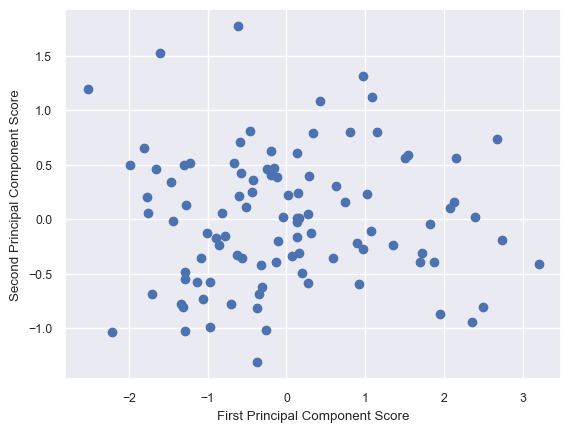

In [58]:

pca3       = decomposition.PCA(n_components = 3)
pca3.fit(df)
print(f'PCA_3 explained_variance_ratio_: {pca3.explained_variance_ratio_}')
print(f'PCA_3 components_:\n {pca3.components_}\n')

# Compute principal component scores
first_principal_component_score     = df.dot(pca3.components_[0])
second_principal_component_score    = df.dot(pca3.components_[1])

# print(f'First Principal Component Score:\n{first_principal_component_score}')
# print(f'Second Principal Component Score:\n{second_principal_component_score}')
plt.scatter(first_principal_component_score, second_principal_component_score)
plt.xlabel("First Principal Component Score")
plt.ylabel("Second Principal Component Score")

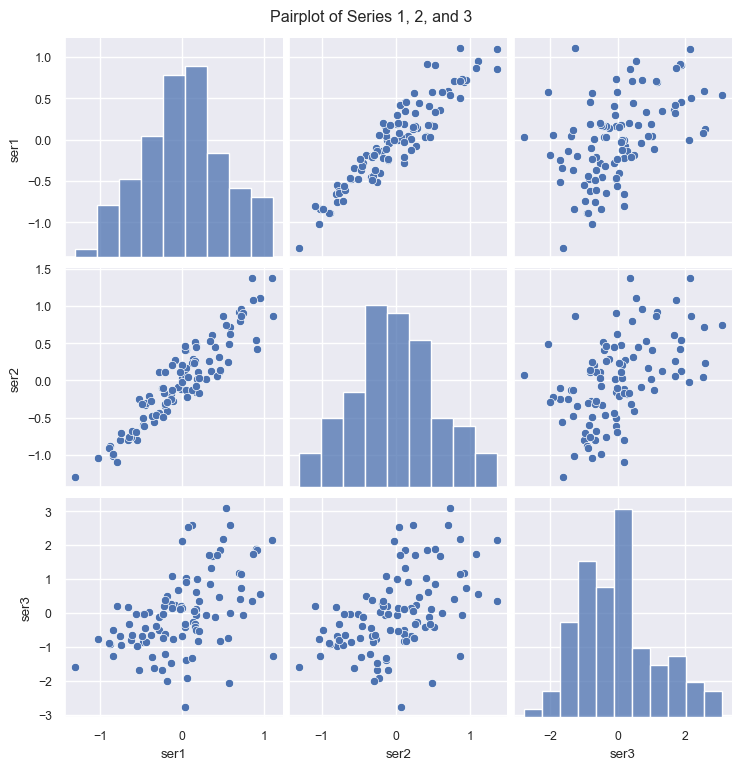

In [47]:

# Pairplot of the original series
sns.pairplot(df)
plt.suptitle("Pairplot of Series 1, 2, and 3", y=1.02)
plt.show()



### <font color='plum'> Outliers in the Upper Left Corner

1. **First Principal Component (PC1) Score**:
   - The outliers in the upper left have **low PC1 scores** (far left on the x-axis).
   - PC1 is heavily weighted toward **series_3** (coefficient ≈ 0.916), so a **low PC1 score** suggests these points have **low values in series_3**.

2. **Second Principal Component (PC2) Score**:
   - These outliers have **high PC2 scores** (upper part of the y-axis).
   - PC2 is a combination of **series_1 and series_2** (positive weights), and a **negative weight for series_3**.
   - Since series_3 is already low (from PC1), a high PC2 score likely means **series_1 and series_2 are relatively high**.

### What Can Be Said About the Series?

- **Series_3**: Definitely **low** for these outliers (due to strong influence on PC1).
- **Series_1 and Series_2**: Likely **high**, but it's harder to say precisely how high or how they compare to each other.
- **Relative values of series_1 vs. series_2**: Hard to determine from PCA alone because PC2 combines them similarly (both have positive weights), and PCA doesn't preserve individual variable relationships.

### Why Is It Hard to Compare Series_1 and Series_2?

- PCA transforms the data into new axes (principal components) that are **linear combinations** of the original variables.
- These components are **uncorrelated**, but they **mix information** from multiple original variables.
- Since series_1 and series_2 are both positively correlated and similarly weighted in PC2, their individual contributions are hard to disentangle.

### Relationship Between Series_1 and Series_2

  `series_2 = series_1 * (1 + noise)`
  
   **series_2 is a noisy version of series_1**, meaning they are **strongly positively correlated**.

---
### My pairplot thoughts 

- Strong linear relationship between **series_1 and series_2** but more spread in **series_3**, due to higher noise.
- Outliers in series_3 would appear as points far from the main diagonal in the ser1–ser3 and ser2–ser3 plots.


### Advantages of the PCA Scatter Plot

- **Dimensionality reduction**: Summarizes 3D data in 2D.
- **Outlier detection**: Clearly shows unusual points.
- **Variance explanation**: PC1 explains ~80% of the variance.

### Disadvantages

- **Loss of interpretability**: Hard to map back to original variables.
- **Ambiguity in variable contribution**: Especially when components mix variables with similar weights.


# 3. Working on your datasets

This week, you will do the same types of exercises as last week, but you should use your chosen datasets that someone in your class found last semester. (They likely will not be the particular datasets that you found yourself.)

Here are some types of analysis you can do:
- Draw **heatmaps**.

- Draw **bubble plots**.

- Perform **Principal Component Analysis** to find out the directions in which the data varies.  Can you represent the data using only its projection onto its first principal component, using the methods described in Week 8?  How much of the variance would this capture?

- Try performing **linear regression analysis** using different sets of features.  Which features seem most likely to be useful to predict other features?

Conclusions:
- Explain what conclusions you would draw from this analysis: are the data what you expect? Are the data likely to be usable? If the data are not useable, find some new data!

- Do you see any outliers? (Data points that are far from the rest of the data).

- Does the Principal Component Analysis suggest a way to represent the data using fewer dimensions than usual - using its first one or two principal component scores, perhaps?

- Try using your correlation information from previous weeks to help choose features for linear regression.

## <font color='plum'> 3.a. Diabetes Health Indicators Dataset
Over 250,000 responses from a U.S. national health survey with demographic and lifestyle variables (e.g., BMI, activity level, smoking, sleep, general health).

Designed for predicting diabetes status (none, pre-diabetic, diabetic).
https://www.kaggle.com/datasets/alexteboul/diabetes-health-indicators-dataset

### Load & Clean

In [22]:
file_path = "alexteboul/diabetes-health-indicators-dataset"
file_name = "diabetes_binary_5050split_health_indicators_BRFSS2015.csv"

df_3a = kagglehub.dataset_load(
  KaggleDatasetAdapter.PANDAS,
  file_path,
  file_name,
)
df_3a.columns = df_3a.columns.str.strip() 
df_3a.head(n = 10)

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,3.0,5.0,30.0,0.0,1.0,4.0,6.0,8.0
1,0.0,1.0,1.0,1.0,26.0,1.0,1.0,0.0,0.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,12.0,6.0,8.0
2,0.0,0.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,10.0,0.0,1.0,13.0,6.0,8.0
3,0.0,1.0,1.0,1.0,28.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,3.0,0.0,1.0,11.0,6.0,8.0
4,0.0,0.0,0.0,1.0,29.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,8.0,5.0,8.0
5,0.0,0.0,0.0,1.0,18.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,2.0,7.0,0.0,0.0,0.0,1.0,4.0,7.0
6,0.0,0.0,1.0,1.0,26.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,1.0,13.0,5.0,6.0
7,0.0,0.0,0.0,1.0,31.0,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,4.0,0.0,0.0,0.0,1.0,6.0,4.0,3.0
8,0.0,0.0,0.0,1.0,32.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,0.0,3.0,6.0,8.0
9,0.0,0.0,0.0,1.0,27.0,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,3.0,0.0,6.0,0.0,1.0,6.0,4.0,4.0


In [23]:
datasets = [
    {
        "name": "Chronic Kidney Disease",
        "path": "rabieelkharoua/chronic-kidney-disease-dataset-analysis",
        "file": "chronic_kidney_disease.csv",
        # "numeric_features": ['Age', 'BloodPressure', 'SpecificGravity', 'Albumin', 'Sugar', 'RedBloodCells', 'Hemoglobin', 'Hematocrit', 'WhiteBloodCells', 'Platelets'],
    },
    # {
    #     "name": "Digital Marketing",
    #     "path": "rabieelkharoua/predict-conversion-in-digital-marketing-dataset",
    #     "file": "digital_marketing_campaign_dataset.csv",
    #     "numeric_features": ['AdSpend', 'ClickThroughRate', 'ConversionRate', 'WebsiteVisits', 'PagesPerVisit', 'TimeOnSite']
    # },
    # {
    #     "name": "Marketing Campaign",
    #     "path": "rodsaldanha/arketing-campaign",
    #     "file": "marketing_campaign.xlsx",
    #     "pandas_kwargs": {"sheet_name": 0},
    #     "numeric_features": ['MntWines', 'MntMeatProducts', 'MntGoldProds', 'NumWebPurchases', 'NumCatalogPurchases', 'Income']
    # }
]

## <font color='plum'> 3.c. Chronic Kidney Disease Dataset

Contains comprehensive data for 1,659 patients, including 54 variables spanning medical history, lab results, medication usage, quality of life, and environmental
exposure. Ideal for regression, classification, and clustering analyses.
https://www.kaggle.com/datasets/rabieelkharoua/chronic-kidney-disease-dataset-analysis

### Data dictionary

- **PatientID**: A unique identifier assigned to each patient (1 to 1,659).
- **Age**: The age of the patients, ranging from 20 to 90 years.
- **Gender**: Gender of the patients, where `0` = Male and `1` = Female.
- **Ethnicity**: The ethnicity of the patients:
  - `0`: Caucasian  
  - `1`: African American  
  - `2`: Asian  
  - `3`: Other
- **SocioeconomicStatus**: The socioeconomic status of the patients.
- **EducationLevel**: Education level of the patients:
  - `0`: None  
  - `1`: High School  
  - `2`: Bachelor's  
  - `3`: Higher
- **BMI**: Body Mass Index, ranging from 15 to 40.
- **Smoking**: Smoking status, where `0` = No and `1` = Yes.
- **AlcoholConsumption**: Weekly alcohol consumption in units (0 to 20).
- **PhysicalActivity**: Weekly physical activity in hours (0 to 10).
- **DietQuality**: Diet quality score (0 to 10).
- **SleepQuality**: Sleep quality score (4 to 10).
- **FamilyHistoryKidneyDisease**: Family history of kidney disease, `0` = No, `1` = Yes.
- **FamilyHistoryHypertension**: Family history of hypertension, `0` = No, `1` = Yes.
- **FamilyHistoryDiabetes**: Family history of diabetes, `0` = No, `1` = Yes.
- **PreviousAcuteKidneyInjury**: History of acute kidney injury, `0` = No, `1` = Yes.
- **UrinaryTractInfections**: History of UTIs, `0` = No, `1` = Yes.
- **SystolicBP**: Systolic blood pressure (90 to 180 mmHg).
- **DiastolicBP**: Diastolic blood pressure (60 to 120 mmHg).
- **FastingBloodSugar**: Fasting blood sugar levels (70 to 200 mg/dL).
- **HbA1c**: Hemoglobin A1c levels (4.0% to 10.0%).
- **SerumCreatinine**: Serum creatinine levels (0.5 to 5.0 mg/dL).
- **BUNLevels**: Blood Urea Nitrogen levels (5 to 50 mg/dL).
- **GFR**: Glomerular Filtration Rate (15 to 120 mL/min/1.73 m²).
- **ProteinInUrine**: Protein levels in urine (0 to 5 g/day).
- **ACR**: Albumin-to-Creatinine Ratio (0 to 300 mg/g).
- **SerumElectrolytesSodium**: Serum sodium levels (135 to 145 mEq/L).
- **SerumElectrolytesPotassium**: Serum potassium levels (3.5 to 5.5 mEq/L).
- **SerumElectrolytesCalcium**: Serum calcium levels (8.5 to 10.5 mg/dL).
- **SerumElectrolytesPhosphorus**: Serum phosphorus levels (2.5 to 4.5 mg/dL).
- **HemoglobinLevels**: Hemoglobin levels (10 to 18 g/dL).
- **CholesterolTotal**: Total cholesterol levels (150 to 300 mg/dL).
- **CholesterolLDL**: LDL cholesterol levels (50 to 200 mg/dL).
- **CholesterolHDL**: HDL cholesterol levels (20 to 100 mg/dL).
- **CholesterolTriglycerides**: Triglycerides levels (50 to 400 mg/dL).
- **ACEInhibitors**: Use of ACE inhibitors, `0` = No, `1` = Yes.
- **Diuretics**: Use of diuretics, `0` = No, `1` = Yes.
- **NSAIDsUse**: Frequency of NSAIDs use (0 to 10 times/week).
- **Statins**: Use of statins, `0` = No, `1` = Yes.
- **AntidiabeticMedications**: Use of antidiabetic medications, `0` = No, `1` = Yes.
- **Edema**: Presence of edema, `0` = No, `1` = Yes.
- **FatigueLevels**: Fatigue levels (0 to 10).
- **NauseaVomiting**: Frequency of nausea and vomiting (0 to 7 times/week).
- **MuscleCramps**: Frequency of muscle cramps (0 to 7 times/week).
- **Itching**: Itching severity (0 to 10).
- **QualityOfLifeScore**: Quality of life score (0 to 100).
- **HeavyMetalsExposure**: Exposure to heavy metals, `0` = No, `1` = Yes.


### Load & Clean

In [24]:
file_path = "rabieelkharoua/chronic-kidney-disease-dataset-analysis"
file_name = "Chronic_Kidney_Dsease_data.csv"

# Load the latest version
df_3c = kagglehub.dataset_load(
  KaggleDatasetAdapter.PANDAS,
  file_path,
  file_name,
)

df_3c.head()

,PatientID,Age,Gender,Ethnicity,SocioeconomicStatus,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,...,Itching,QualityOfLifeScore,HeavyMetalsExposure,OccupationalExposureChemicals,WaterQuality,MedicalCheckupsFrequency,MedicationAdherence,HealthLiteracy,Diagnosis,DoctorInCharge
0,1,71,0,0,0,2,31.069414,1,5.128112,1.676220,...,7.556302,76.076800,0,0,1,1.018824,4.966808,9.871449,1,Confidential
1,2,34,0,0,1,3,29.692119,1,18.609552,8.377574,...,6.836766,40.128498,0,0,0,3.923538,8.189275,7.161765,1,Confidential
2,3,80,1,1,0,1,37.394822,1,11.882429,9.607401,...,2.144722,92.872842,0,1,1,1.429906,7.624028,7.354632,1,Confidential
3,4,40,0,2,0,1,31.329680,0,16.020165,0.408871,...,7.077188,90.080321,0,0,0,3.226416,3.282688,6.629587,1,Confidential
4,5,43,0,1,1,2,23.726311,0,7.944146,0.780319,...,3.553118,5.258372,0,0,1,0.285466,3.849498,1.437385,1,Confidential


In [25]:
df_3c.columns = df_3c.columns.str.strip()
columns_to_drop = ['PatientID', 'DoctorInCharge']  # Columns to drop
df_3c.drop(columns=columns_to_drop, inplace=True, errors='ignore')  # Drop specified columns

# df_3c.info()

In [26]:
target_col          = 'Diagnosis'

y                   = df_3c[target_col]
X_df                = df_3c.drop(columns = [target_col])
categorical_cols    = []
numeric_cols        = []

for col in X_df:
    if len(X_df[col].unique()) < 5:
        categorical_cols.append(col)
    else:
        numeric_cols.append(col)
    print(f'{col}: {X_df[col].nunique()} unique values\n')

Age: 71 unique values

Gender: 2 unique values

Ethnicity: 4 unique values

SocioeconomicStatus: 3 unique values

EducationLevel: 4 unique values

BMI: 1659 unique values

Smoking: 2 unique values

AlcoholConsumption: 1659 unique values

PhysicalActivity: 1659 unique values

DietQuality: 1659 unique values

SleepQuality: 1659 unique values

FamilyHistoryKidneyDisease: 2 unique values

FamilyHistoryHypertension: 2 unique values

FamilyHistoryDiabetes: 2 unique values

PreviousAcuteKidneyInjury: 2 unique values

UrinaryTractInfections: 2 unique values

SystolicBP: 90 unique values

DiastolicBP: 60 unique values

FastingBloodSugar: 1659 unique values

HbA1c: 1659 unique values

SerumCreatinine: 1659 unique values

BUNLevels: 1659 unique values

GFR: 1659 unique values

ProteinInUrine: 1659 unique values

ACR: 1659 unique values

SerumElectrolytesSodium: 1659 unique values

SerumElectrolytesPotassium: 1659 unique values

SerumElectrolytesCalcium: 1659 unique values

SerumElectrolytesPhosph

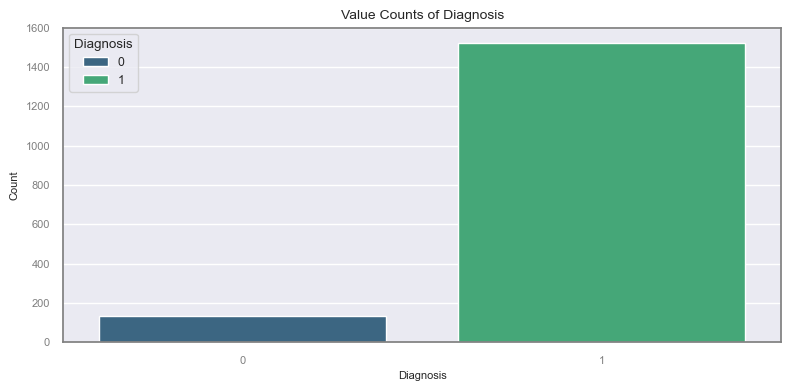

In [27]:
# plot the value counts of the target column
plt.figure(figsize=(8, 4))
sns.countplot(data=df_3c, x=target_col, hue=target_col, palette='viridis')
plt.title(f'Value Counts of {target_col}')
plt.xlabel(target_col)
plt.ylabel('Count') 
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

In [28]:
print(f"Categorical columns: {categorical_cols}")
print(f"Numeric columns: {numeric_cols}")
print(f'# Categorical cols: {len(categorical_cols)}, # Numeric cols: {len(numeric_cols)}')

categorical_cols_nominal = ['Ethnicity','SocioeconomicStatus', 'EducationLevel']


Categorical columns: ['Gender', 'Ethnicity', 'SocioeconomicStatus', 'EducationLevel', 'Smoking', 'FamilyHistoryKidneyDisease', 'FamilyHistoryHypertension', 'FamilyHistoryDiabetes', 'PreviousAcuteKidneyInjury', 'UrinaryTractInfections', 'ACEInhibitors', 'Diuretics', 'Statins', 'AntidiabeticMedications', 'Edema', 'HeavyMetalsExposure', 'OccupationalExposureChemicals', 'WaterQuality']
Numeric columns: ['Age', 'BMI', 'AlcoholConsumption', 'PhysicalActivity', 'DietQuality', 'SleepQuality', 'SystolicBP', 'DiastolicBP', 'FastingBloodSugar', 'HbA1c', 'SerumCreatinine', 'BUNLevels', 'GFR', 'ProteinInUrine', 'ACR', 'SerumElectrolytesSodium', 'SerumElectrolytesPotassium', 'SerumElectrolytesCalcium', 'SerumElectrolytesPhosphorus', 'HemoglobinLevels', 'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL', 'CholesterolTriglycerides', 'NSAIDsUse', 'FatigueLevels', 'NauseaVomiting', 'MuscleCramps', 'Itching', 'QualityOfLifeScore', 'MedicalCheckupsFrequency', 'MedicationAdherence', 'HealthLiteracy']
#

In [29]:
## Some groupings of variables for analysis
demographics            = ["Age", "Gender", "Ethnicity", "SocioeconomicStatus", "EducationLevel"]
lifestyle_factors       = ["BMI", "Smoking", "AlcoholConsumption", "PhysicalActivity", "DietQuality", "SleepQuality"]
family_medical_history  = ["FamilyHistoryKidneyDisease", "FamilyHistoryHypertension", "FamilyHistoryDiabetes"]
medical_history         = ["PreviousAcuteKidneyInjury", "UrinaryTractInfections"]

vital_signs_lab_results = [
    "SystolicBP", "DiastolicBP", "FastingBloodSugar", "HbA1c", "SerumCreatinine", "BUNLevels", "GFR",
    "ProteinInUrine", "ACR", "SerumElectrolytesSodium", "SerumElectrolytesPotassium",
    "SerumElectrolytesCalcium", "SerumElectrolytesPhosphorus", "HemoglobinLevels",
    "CholesterolTotal", "CholesterolLDL", "CholesterolHDL", "CholesterolTriglycerides"
]

medications                 = ["ACEInhibitors", "Diuretics", "NSAIDsUse", "Statins", "AntidiabeticMedications"]
symptoms                    = ["Edema", "FatigueLevels", "NauseaVomiting", "MuscleCramps", "Itching"]
quality_of_life_environment = ["QualityOfLifeScore", "HeavyMetalsExposure", "OccupationalExposureChemicals", "WaterQuality"]
healthcare_engagement       = ["MedicalCheckupsFrequency", "MedicationAdherence", "HealthLiteracy"]


dict_variable_groups = {
    "Demographics": demographics,
    "Lifestyle Factors": lifestyle_factors,
    "Family Medical History": family_medical_history,
    "Medical History": medical_history,
    "Vital Signs & Lab Results": vital_signs_lab_results,
    "Medications": medications,
    "Symptoms": symptoms,
    "Quality of Life & Environment": quality_of_life_environment,
    "Healthcare Engagement": healthcare_engagement 
    }

### Heatmaps

#### All Features

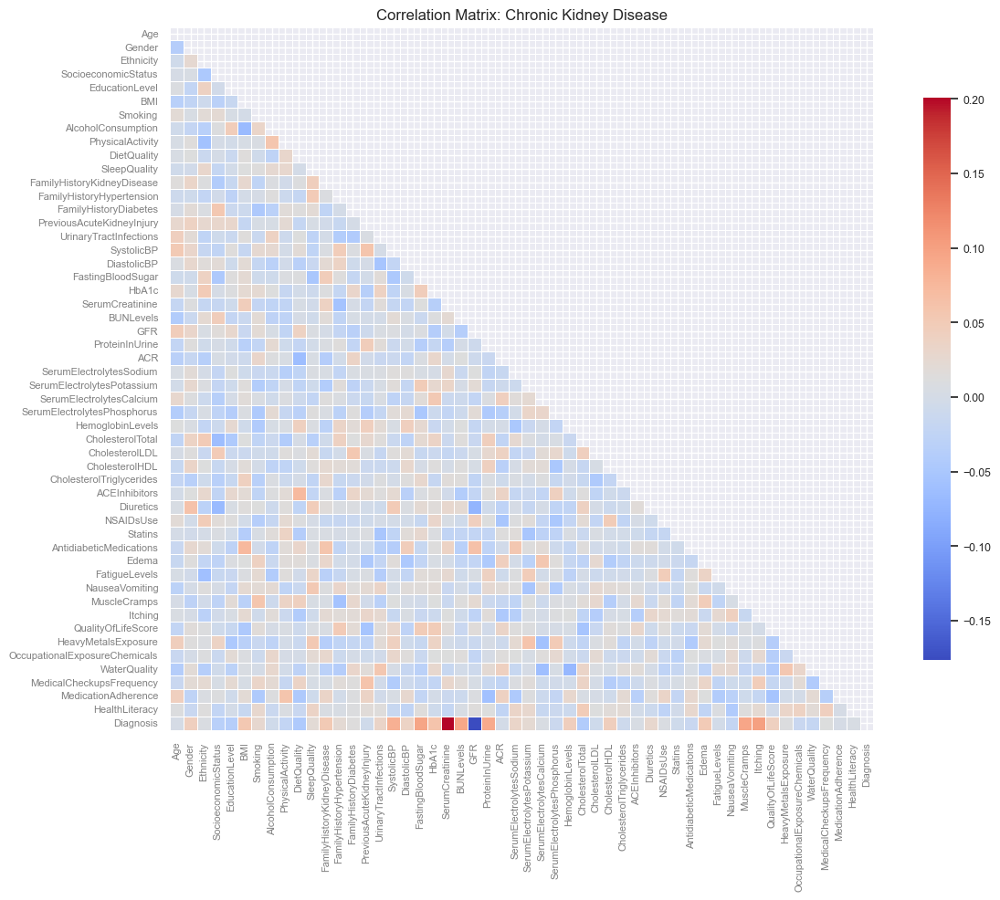

In [30]:
# ALL FEATURES
get_correl_matrix(df_3c, 'Chronic Kidney Disease', data_labels=False, colormap = 'coolwarm', method = 'pearson') 

#### Heatmaps by variable groups

Demographics: ['Age', 'Gender', 'Ethnicity', 'SocioeconomicStatus', 'EducationLevel']


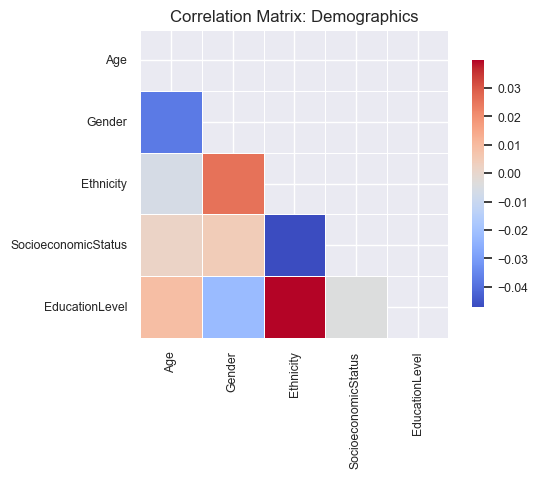

Lifestyle Factors: ['BMI', 'Smoking', 'AlcoholConsumption', 'PhysicalActivity', 'DietQuality', 'SleepQuality']


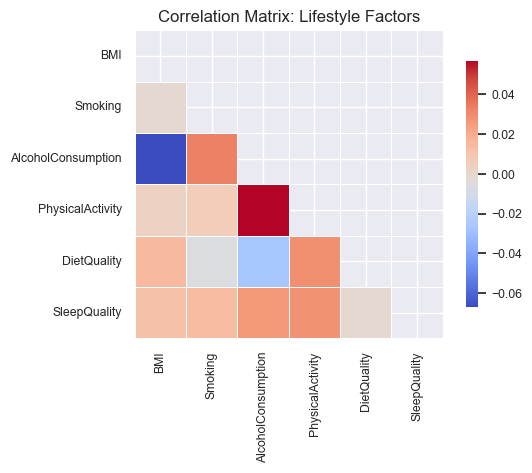

Family Medical History: ['FamilyHistoryKidneyDisease', 'FamilyHistoryHypertension', 'FamilyHistoryDiabetes']


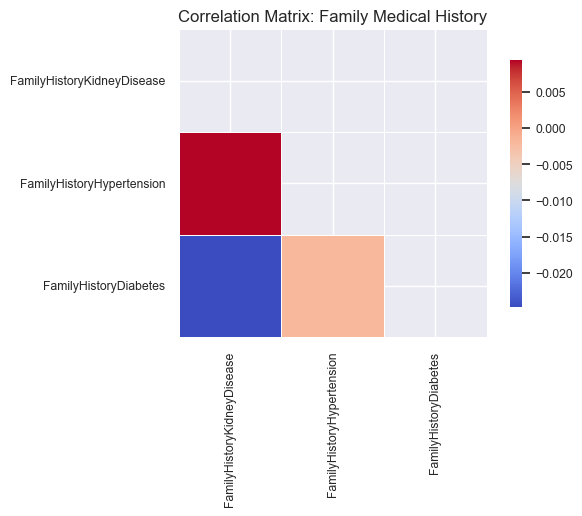

Medical History: ['PreviousAcuteKidneyInjury', 'UrinaryTractInfections']


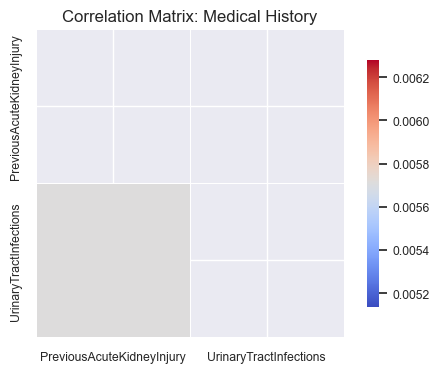

Vital Signs & Lab Results: ['SystolicBP', 'DiastolicBP', 'FastingBloodSugar', 'HbA1c', 'SerumCreatinine', 'BUNLevels', 'GFR', 'ProteinInUrine', 'ACR', 'SerumElectrolytesSodium', 'SerumElectrolytesPotassium', 'SerumElectrolytesCalcium', 'SerumElectrolytesPhosphorus', 'HemoglobinLevels', 'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL', 'CholesterolTriglycerides']


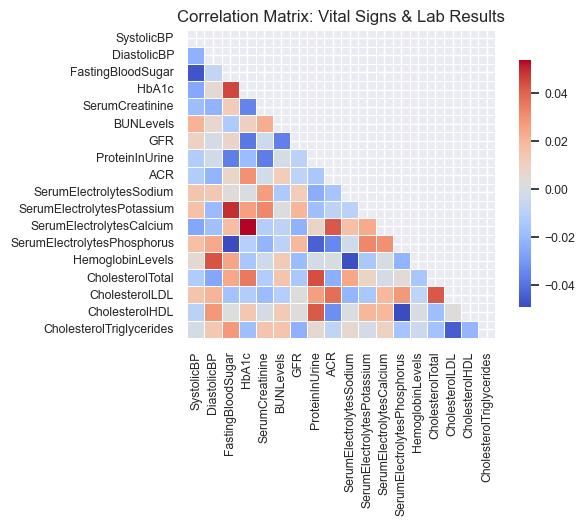

Medications: ['ACEInhibitors', 'Diuretics', 'NSAIDsUse', 'Statins', 'AntidiabeticMedications']


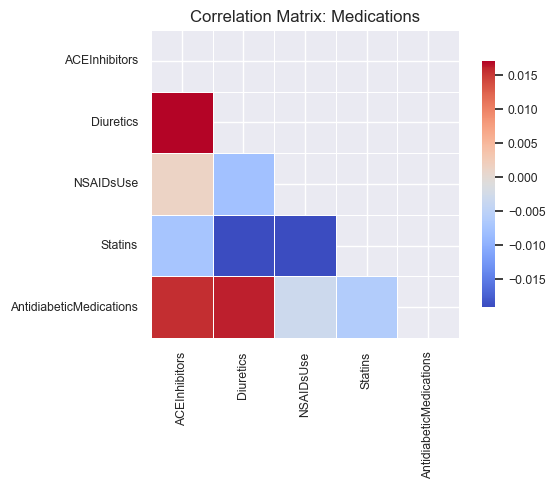

Symptoms: ['Edema', 'FatigueLevels', 'NauseaVomiting', 'MuscleCramps', 'Itching']


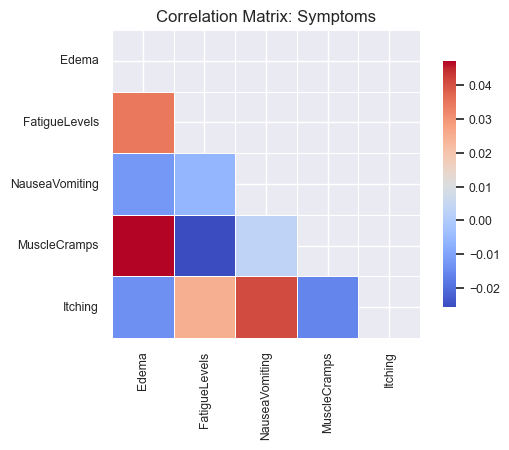

Quality of Life & Environment: ['QualityOfLifeScore', 'HeavyMetalsExposure', 'OccupationalExposureChemicals', 'WaterQuality']


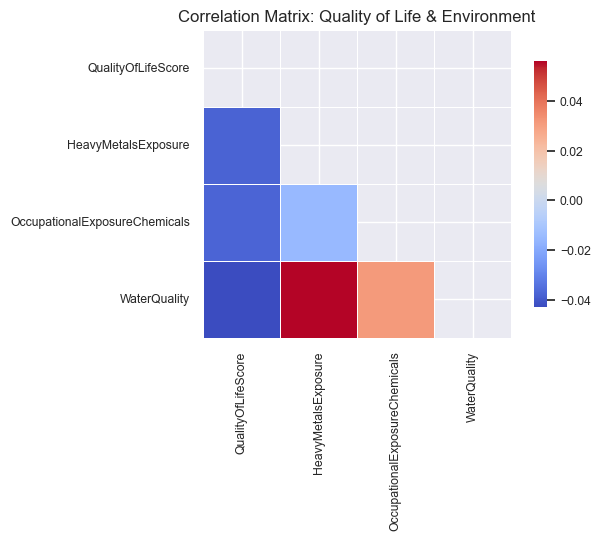

Healthcare Engagement: ['MedicalCheckupsFrequency', 'MedicationAdherence', 'HealthLiteracy']


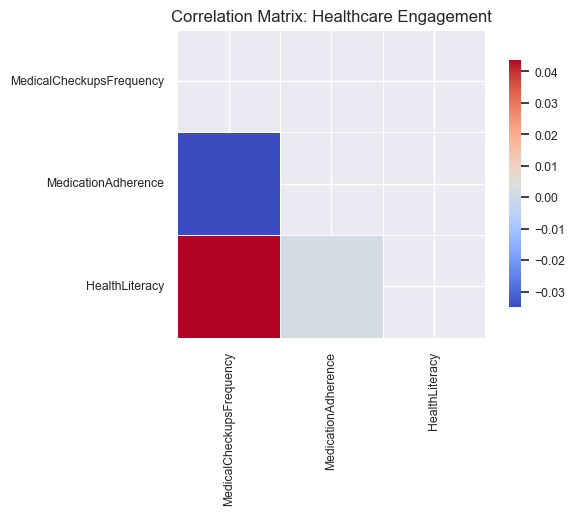

In [31]:
for item in dict_variable_groups:
    print(f'{item}: {dict_variable_groups[item]}')
    get_correl_matrix(df_3c[dict_variable_groups[item]], item, data_labels=False, colormap = 'coolwarm', method = 'pearson', figsize = (6,4))

In [32]:
correlation_matrix = df_3c.corr()
correlation_matrix = correlation_matrix.drop(columns = [target_col])


strong_corr_cols = [col for col in correlation_matrix.columns if abs(correlation_matrix.loc['Diagnosis', col]) >= 0.05]
strong_corr_cols
strong_corr_matrix = correlation_matrix[strong_corr_cols].loc[strong_corr_cols]


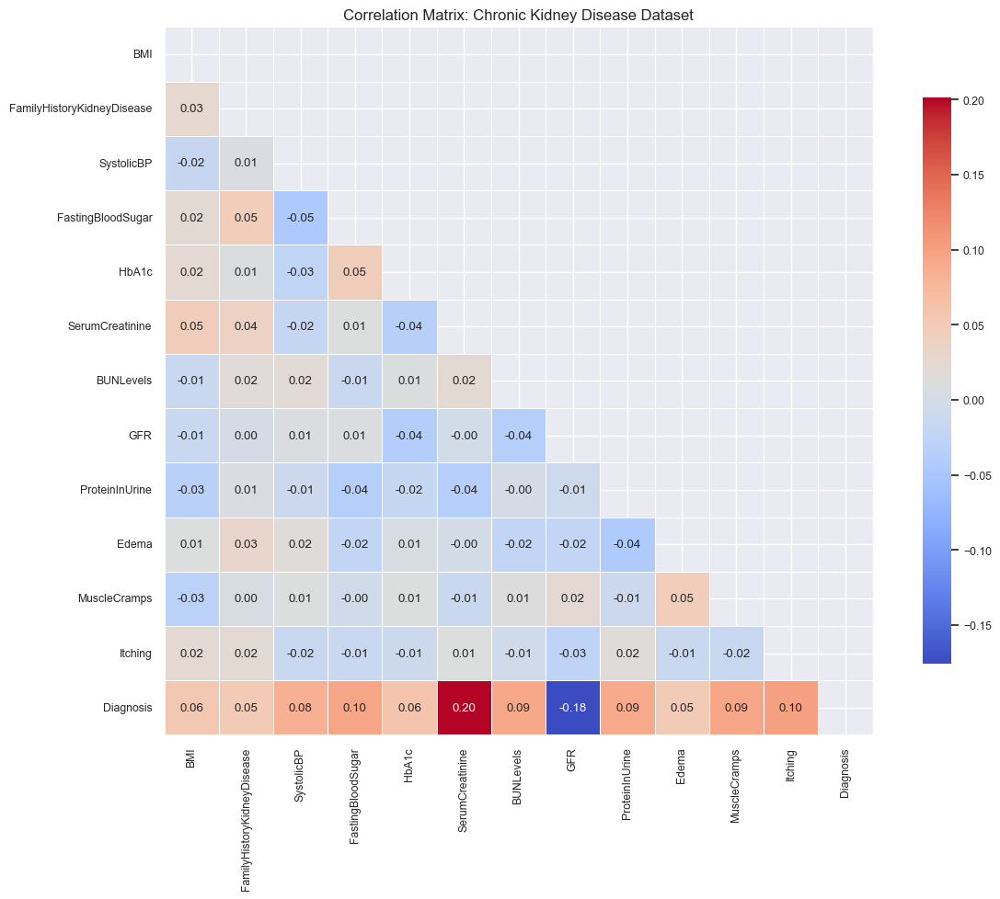

In [33]:
strong_corr_heatmap = get_correl_matrix(
    df_3c[strong_corr_matrix.columns.tolist() + [target_col]],
    dataset_name = "Chronic Kidney Disease Dataset",
    colormap = 'coolwarm',
    data_labels = True,
    method = 'pearson'
)

### Bubble plots

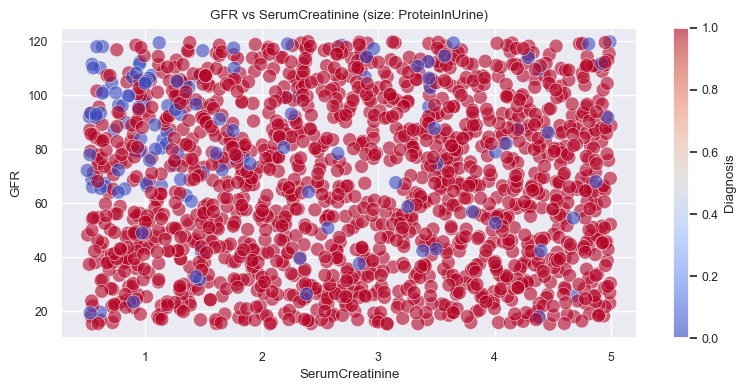

In [34]:

plot_bubble(df_3c, x_col='SerumCreatinine', y_col='GFR', size_col='ProteinInUrine', color_col='Diagnosis', s = 100)


In [35]:

numeric_cols = [col for col in numeric_cols if col in df_3c.columns]
print(f'Numeric columns: {numeric_cols}')

# limit bubble plot combinations to numeric_cols 


Numeric columns: ['Age', 'BMI', 'AlcoholConsumption', 'PhysicalActivity', 'DietQuality', 'SleepQuality', 'SystolicBP', 'DiastolicBP', 'FastingBloodSugar', 'HbA1c', 'SerumCreatinine', 'BUNLevels', 'GFR', 'ProteinInUrine', 'ACR', 'SerumElectrolytesSodium', 'SerumElectrolytesPotassium', 'SerumElectrolytesCalcium', 'SerumElectrolytesPhosphorus', 'HemoglobinLevels', 'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL', 'CholesterolTriglycerides', 'NSAIDsUse', 'FatigueLevels', 'NauseaVomiting', 'MuscleCramps', 'Itching', 'QualityOfLifeScore', 'MedicalCheckupsFrequency', 'MedicationAdherence', 'HealthLiteracy']


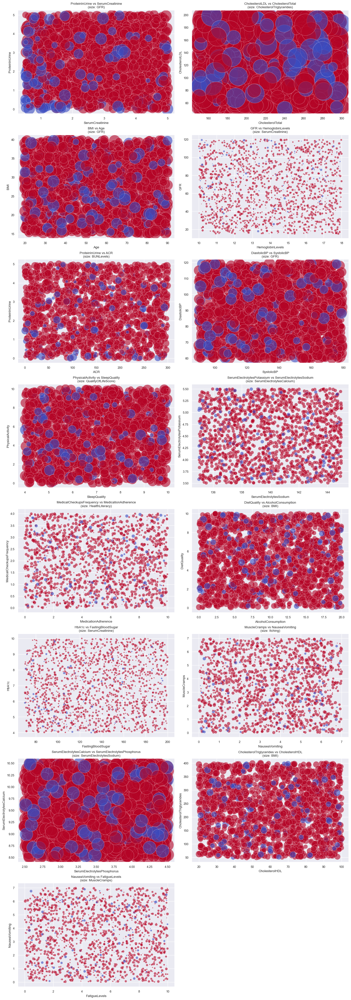

In [36]:

bubble_combinations = [
    ("SerumCreatinine",  "ProteinInUrine", "GFR"),
    ("CholesterolTotal", "CholesterolLDL", "CholesterolTriglycerides"),
    ("Age", "BMI", "GFR"),
    ("HemoglobinLevels", "GFR", "SerumCreatinine"),
    ("ACR", "ProteinInUrine", "BUNLevels"),
    ("SystolicBP", "DiastolicBP", "GFR"),
    ("SleepQuality", "PhysicalActivity", "QualityOfLifeScore"),
    ("SerumElectrolytesSodium", "SerumElectrolytesPotassium", "SerumElectrolytesCalcium"),
    ("MedicationAdherence", "MedicalCheckupsFrequency", "HealthLiteracy"),
    ("AlcoholConsumption", "DietQuality", "BMI"),
]

# suggest more combinations
bubble_combinations += [
    ("FastingBloodSugar", "HbA1c", "SerumCreatinine"),
    ("NauseaVomiting", "MuscleCramps", "Itching"),
    ("SerumElectrolytesPhosphorus", "SerumElectrolytesCalcium", "SerumElectrolytesSodium"),
    ("CholesterolHDL", "CholesterolTriglycerides", "BMI"),
    ("FatigueLevels", "NauseaVomiting", "MuscleCramps"),
]

#  number of rows and columns
n_cols = 2
n_rows = (len(bubble_combinations) + 1) // n_cols

#  subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 5 * n_rows), constrained_layout=True)
axes = axes.flatten()

# Generate each subplot
for i, (x_col, y_col, size_col) in enumerate(bubble_combinations):
    scatter = plot_bubble_subplot(axes[i], df_3c, x_col, y_col, size_col)

# Hide any unused subplots
for j in range(len(bubble_combinations), len(axes)):
    fig.delaxes(axes[j])

# Add colorbar 
# cbar = fig.colorbar(scatter, ax=axes.tolist(), label='Diagnosis')
# plt.tight_layout()
plt.show()


#  bubble plots for each combination
# for x_col, y_col, size_col in bubble_combinations:
#     plot_bubble(df_3c, x_col, y_col, size_col, 'Diagnosis')


### PCA

#### PCA - Numerical features only

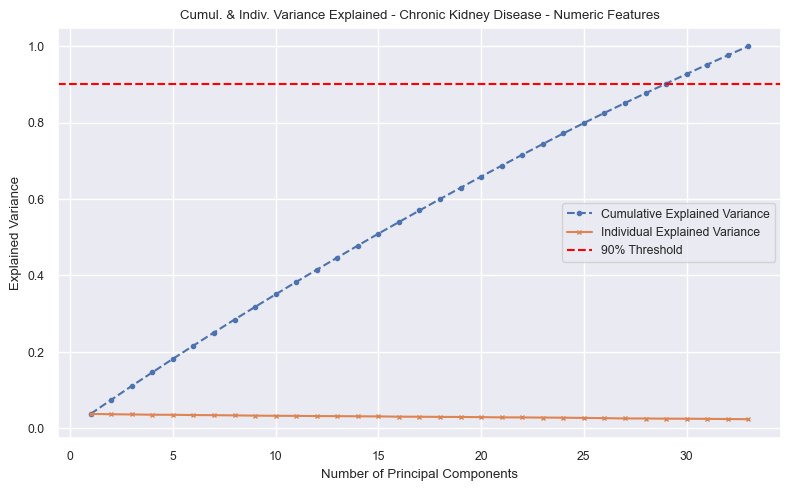

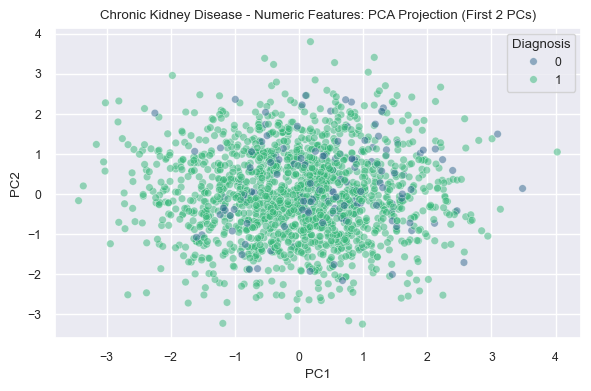

Chronic Kidney Disease - Numeric Features:
First PC explains 3.77% of variance
Total Variance Explained by First 2 PCs: 7.45%


(           PC1       PC2  Diagnosis
 0    -0.632725 -1.612498          1
 1    -0.169589  1.459402          1
 2     0.434897  0.312967          1
 3    -1.807831 -0.492760          1
 4     0.902789  0.032840          1
 ...        ...       ...        ...
 1654  0.149039 -0.463768          0
 1655  1.305534  0.159686          0
 1656  1.730773 -0.719518          0
 1657  1.528898 -0.665663          1
 1658 -1.313744 -0.660140          1
 
 [1659 rows x 3 columns],
 array([0.03770498, 0.03677412, 0.03628541, 0.03555151, 0.03536333,
        0.03466165, 0.03436435, 0.03382371, 0.03313666, 0.03272008,
        0.03258732, 0.03195594, 0.03182619, 0.03143022, 0.03112045,
        0.03044317, 0.03028012, 0.02984229, 0.02968125, 0.02922535,
        0.02859133, 0.02850691, 0.02805751, 0.02776975, 0.02720448,
        0.02658127, 0.02580788, 0.02565734, 0.02518817, 0.02505478,
        0.02470973, 0.02424937, 0.02384338]))

In [37]:
run_pca_analysis(df_3c, numeric_cols, 'Chronic Kidney Disease - Numeric Features', target_col)

<font color='plum'>@#$%!, It's the same problem with these damn synthetic datasets. Arficially low correlations between features, which neuters any meaningful principal component analysis. I would need at least 29 principal components to capture 90% of the variance !



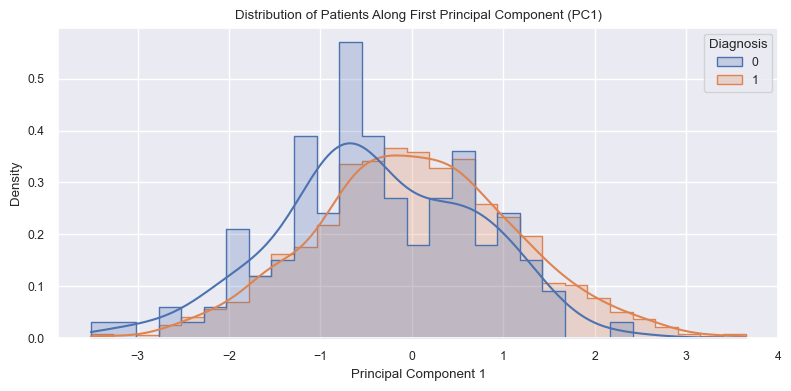

Explained variance of the first few components: [0.03744907]


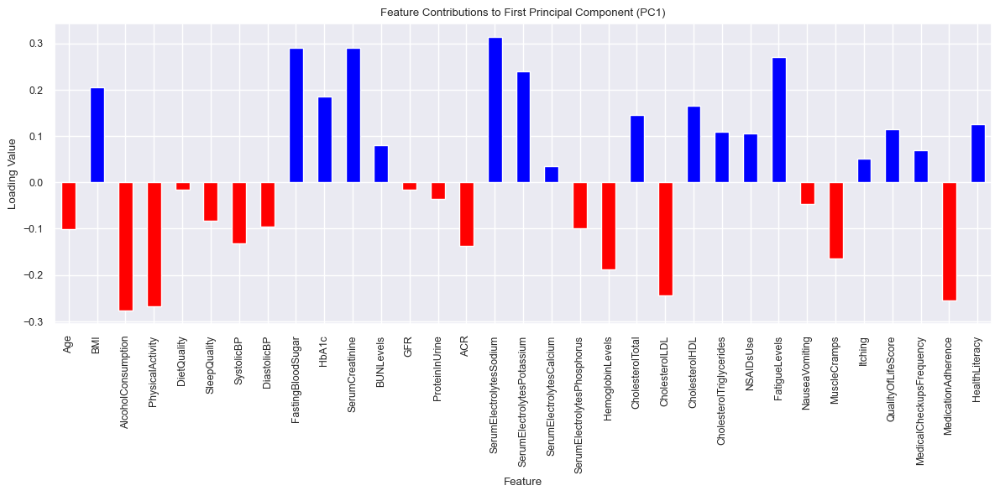

In [38]:

target = df_3c[target_col]

scaler      = StandardScaler()
X_scaled    = scaler.fit_transform(df_3c[numeric_cols])

# Apply PCA and keep only the first principal component
pca     = PCA(n_components = 1)
X_pca   = pca.fit_transform(X_scaled)

pca_df = pd.DataFrame({
    'PC1': X_pca.flatten(),
    'Diagnosis': target
})

# Plot the distribution along the first principal component
plt.figure(figsize=(8, 4))
sns.histplot(data=pca_df, x='PC1', hue='Diagnosis', kde=True, element='step', stat='density', common_norm=False)
plt.title('Distribution of Patients Along First Principal Component (PC1)')
plt.xlabel('Principal Component 1')
plt.ylabel('Density')
plt.grid(True)
plt.tight_layout()
plt.show()
print(f'Explained variance of the first few components: {pca.explained_variance_ratio_[:5]}')


# Get the loadings for the first principal component
pc1_loadings = pd.Series(pca.components_[0], index = numeric_cols)

# Plot the loadings with color based on sign
colors = ['red' if val < 0 else 'blue' for val in pc1_loadings]

plt.figure(figsize=(12, 6))
pc1_loadings.plot(kind='bar', color=colors)
plt.title('Feature Contributions to First Principal Component (PC1)')
plt.ylabel('Loading Value')
plt.xlabel('Feature')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()



<font color = 'plum'> 
The overlap between the distributions confirms that PC1 alone can't possibly separate the two groups.

#### PCA - Numerical + Categorical (binary and ordinal only) features

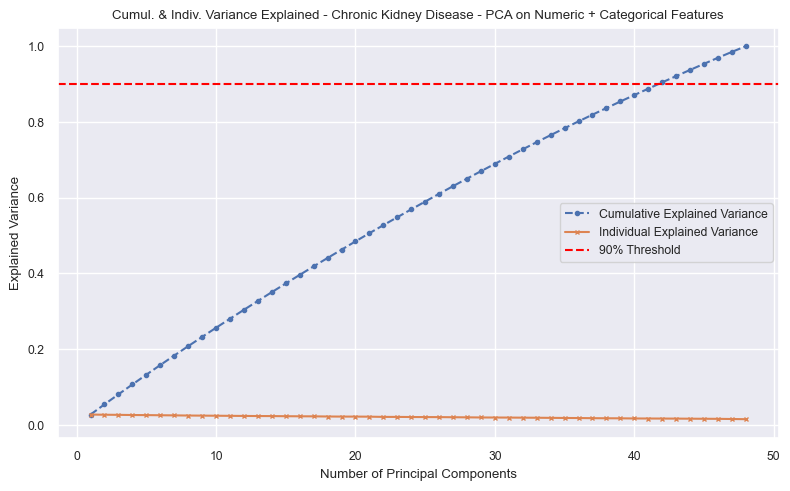

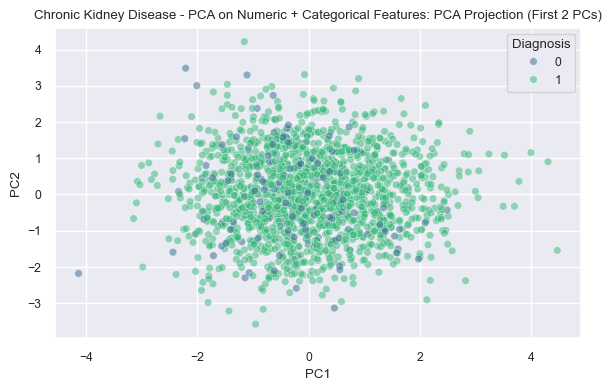

Chronic Kidney Disease - PCA on Numeric + Categorical Features:
First PC explains 2.73% of variance
Total Variance Explained by First 2 PCs: 5.41%


(           PC1       PC2  Diagnosis
 0    -0.423622 -0.242453          1
 1     0.842873  0.367443          1
 2     0.053458 -0.060493          1
 3     0.863748  0.146524          1
 4    -1.027436 -0.075822          1
 ...        ...       ...        ...
 1654  0.463050 -3.137338          0
 1655 -0.970150  0.098172          0
 1656 -1.390836  0.555971          0
 1657 -1.340833 -0.024263          1
 1658  1.056698  0.576555          1
 
 [1659 rows x 3 columns],
 array([0.02730165, 0.02680318, 0.0265082 , 0.02603983, 0.02582221,
        0.0254471 , 0.02512284, 0.0246946 , 0.02447123, 0.02416393,
        0.02388635, 0.02361919, 0.0233469 , 0.02324675, 0.0228889 ,
        0.02267602, 0.02253948, 0.02213159, 0.02192233, 0.02188293,
        0.0216827 , 0.02109599, 0.02104115, 0.02076179, 0.02060915,
        0.0204943 , 0.02019866, 0.01993615, 0.01955737, 0.01945408,
        0.01930169, 0.01907258, 0.01886006, 0.01856268, 0.0182801 ,
        0.0180483 , 0.01771807, 0.01746224, 0.017330

In [39]:
X_df_PCA = X_df.drop(columns = categorical_cols_nominal, errors='ignore')


run_pca_analysis(df_3c, X_df_PCA.columns.tolist(), 'Chronic Kidney Disease - PCA on Numeric + Categorical Features', target_col)



### Regressions

<font color='plum'> Before running any kind of ML algorithm on a dataset this imbalanced, we need to adjust the class distribution with data balancing techniques like oversampling, undersampling, SMOTE, etc. 

#### Logistic Regression

In [40]:
%pip install imbalanced-learn
from imblearn.over_sampling import SMOTE

##### LOGISTIC REGRESSION #######


# train test split
X_train, X_test, y_train, y_test = train_test_split(X_df, y, test_size=test_size, random_state=random_state, stratify=y)

# scale numeric features
scaler                  = StandardScaler()
X_train[numeric_cols]   = scaler.fit_transform(X_train[numeric_cols])
X_test[numeric_cols]    = scaler.transform(X_test[numeric_cols])

# Apply SMOTE to handle class imbalance
smote = SMOTE(random_state = random_state, k_neighbors = 3)
X_train, y_train = smote.fit_resample(X_train, y_train)

# instantiate the model
log_reg                 = LogisticRegression(max_iter = 1000, random_state = random_state)
log_reg.fit(X_train, y_train)

# make predictions
y_pred = log_reg.predict(X_test)
# evaluate the model
accuracy        = accuracy_score(y_test, y_pred)
conf_matrix     = confusion_matrix(y_test, y_pred)
class_report    = classification_report(y_test, y_pred)
roc_auc         = roc_auc_score(y_test, log_reg.predict_proba(X_test)[:, 1])
print(f'Accuracy: {accuracy:.4f}')
print(f'ROC AUC: {roc_auc:.4f}')
print('Confusion Matrix:\n', conf_matrix)
print('Classification Report:\n', class_report)

Note: you may need to restart the kernel to use updated packages.
Accuracy: 0.8313
ROC AUC: 0.7409
Confusion Matrix:
 [[ 12  15]
 [ 41 264]]
Classification Report:
               precision    recall  f1-score   support

           0       0.23      0.44      0.30        27
           1       0.95      0.87      0.90       305

    accuracy                           0.83       332
   macro avg       0.59      0.66      0.60       332
weighted avg       0.89      0.83      0.85       332



#### Linear Regressions of Feature Subsets


--- Regression Task: Predict GFR ---
R-squared: -0.0190
Mean Squared Error: 853.6585
Coefficients:
  SerumCreatinine: 0.0774
  BUNLevels: -0.0614
  Age: 0.0542
  SystolicBP: 0.0019
  DiastolicBP: -0.0269
  ProteinInUrine: -0.3102
  ACR: -0.0011
Intercept: 69.3228


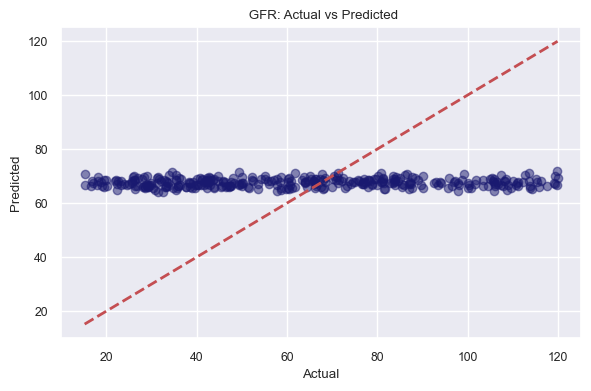


--- Regression Task: Predict ACR ---
R-squared: -0.0129
Mean Squared Error: 7784.5006
Coefficients:
  ProteinInUrine: -1.8380
  GFR: -0.0107
  SerumCreatinine: -1.8886
  BUNLevels: 0.0216
Intercept: 158.7975


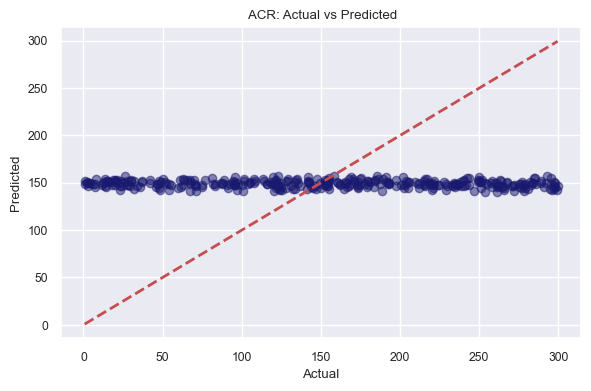


--- Regression Task: Predict HemoglobinLevels ---
R-squared: -0.0157
Mean Squared Error: 5.5827
Coefficients:
  SerumCreatinine: 0.0199
  BUNLevels: -0.0005
  GFR: -0.0028
  Age: 0.0015
  FatigueLevels: -0.0388
  NauseaVomiting: 0.0180
Intercept: 14.1139


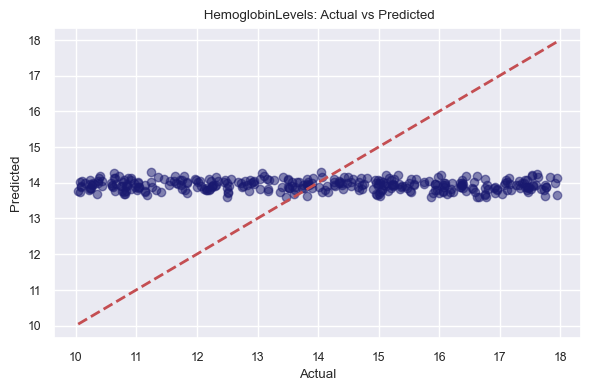


--- Regression Task: Predict CholesterolTriglycerides ---
R-squared: 0.0039
Mean Squared Error: 10575.5759
Coefficients:
  CholesterolLDL: -0.1085
  CholesterolHDL: -0.0313
  BMI: 0.5115
  DietQuality: -0.2809
Intercept: 227.4635


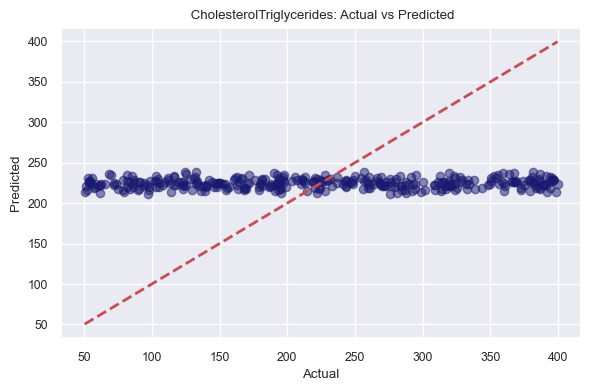


--- Regression Task: Predict ProteinInUrine ---
R-squared: -0.0048
Mean Squared Error: 2.2299
Coefficients:
  GFR: -0.0007
  SerumCreatinine: -0.0395
  BUNLevels: -0.0006
  ACR: -0.0005
  NSAIDsUse: -0.0042
Intercept: 2.7733


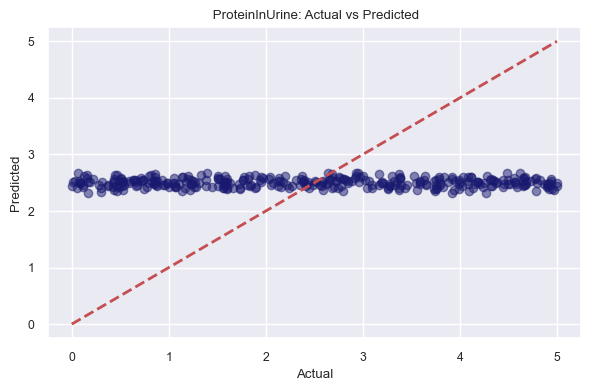

In [41]:
results_gfr = run_regression_task(df_3c, ['SerumCreatinine', 'BUNLevels','Age','SystolicBP','DiastolicBP','ProteinInUrine','ACR'], 'GFR', numeric_cols)
results_bp  = run_regression_task(df_3c, ['ProteinInUrine', 'GFR', 'SerumCreatinine', 'BUNLevels'], 'ACR', numeric_cols)
results_hgb = run_regression_task(df_3c, ['SerumCreatinine', 'BUNLevels','GFR','Age','FatigueLevels','NauseaVomiting'], 'HemoglobinLevels', numeric_cols)
results_chol = run_regression_task(df_3c, ['CholesterolLDL', 'CholesterolHDL', 'BMI', 'DietQuality'], 'CholesterolTriglycerides', numeric_cols)
results_piu = run_regression_task(df_3c, ['GFR', 'SerumCreatinine', 'BUNLevels', 'ACR', 'NSAIDsUse'], 'ProteinInUrine', numeric_cols)



--- Outlier Detection ---


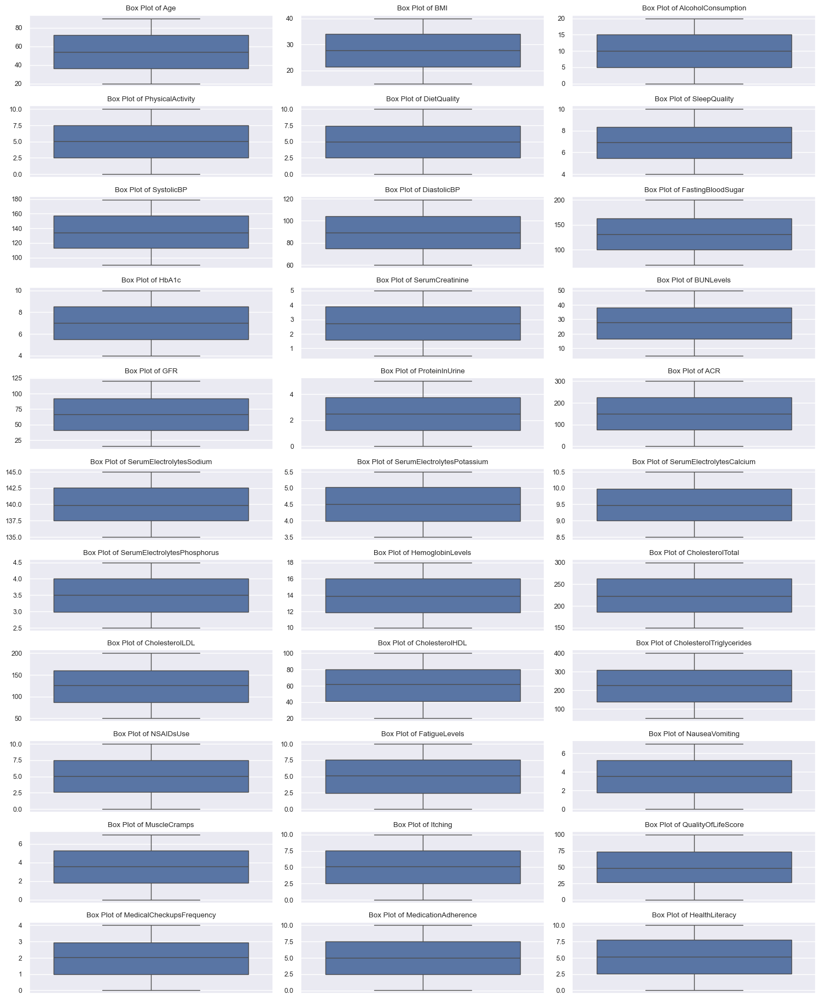

In [42]:
# --- Outlier Detection (using box plots for numeric columns) ---
print("\n--- Outlier Detection ---")
plt.figure(figsize=(15, 20))
for i, col in enumerate(numeric_cols):
    plt.subplot(len(numeric_cols)//3 + 1, 3, i + 1)
    sns.boxplot(y=df_3c[col])
    plt.title(f'Box Plot of {col}')
    plt.ylabel('')
plt.tight_layout()
plt.show()

# 4. Storytelling With Data plot

Reproduce any graph of your choice in p. 136-150 of the Storytelling With Data book as best you can. ("The power of super-categories" to the end of chapter 5). You do not have to get the exact data values right, just the overall look and feel.

<font color='plum'> Figure 5.13 from page 148 of *Storytelling with Data*

In [43]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_stacked_bar(ax, df, column_name, colors, x_label):
    """
    Plots a single stacked bar chart on the given axes.

    Args:
        ax: The matplotlib axes object.
        df: The pandas DataFrame containing the data.
        column_name: The name of the column to plot.
        colors: A list of colors for the segments.
        x_label: The label for the x-axis position of the bar.
    """
    bottom = 0
    for i, (row, color) in enumerate(zip(df.iterrows(), colors)):
        value = row[1][column_name]
        ax.bar(x_label, value, bottom=bottom, color=color, width=0.5, edgecolor='white')
        ax.text(x_label, bottom + value / 2, f"{value}%",
                ha='center', va='center',
                color='white' if color == '#1F497D' else 'black',
                fontsize=10)
        bottom += value


In [44]:


data = {
    'Segment': [f'Segment {i}' for i in range(1, 8)],
    'US_Population': [16, 7, 10, 10, 10, 32, 15],
    'Our_Customers': [9, 10, 15, 18, 17, 20, 11]
}
df = pd.DataFrame(data)
columns = df.columns.to_list()
# print(columns)
# Define colors for the segments
colors = ['#C0C0C0', '#C0C0C0', '#1F497D', '#1F497D', '#1F497D', '#C0C0C0', '#C0C0C0']

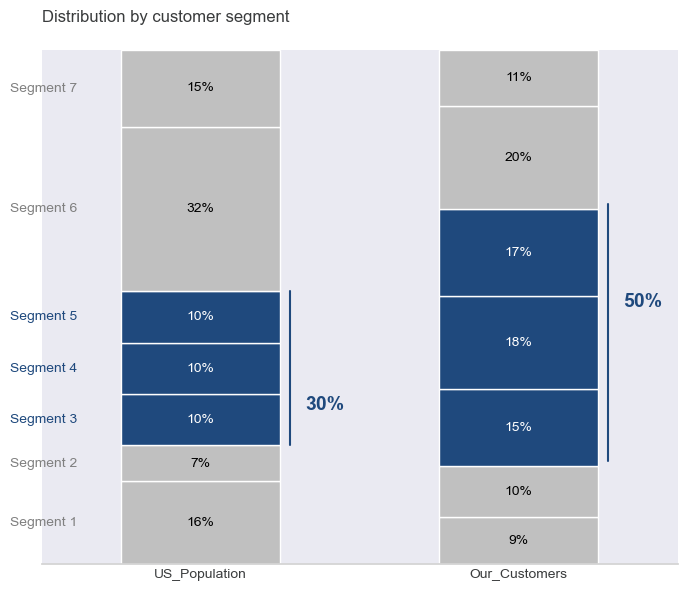

In [45]:


fig, ax = plt.subplots(figsize=(8, 6))

# Plot both stacked bars using the function
plot_stacked_bar(ax, df, column_name=columns[1], colors=colors, x_label=columns[1])
plot_stacked_bar(ax, df, column_name=columns[2], colors=colors, x_label=columns[2])

# Add annotations for  combined percentages
ax.text(0.45, 30, '30%', color='#1F497D', fontsize=14, fontweight='bold', ha='right')
ax.plot([0.28, 0.28], [23, 53], color='#1F497D', linewidth=1.5)

ax.text(1.45, 50, '50%', color='#1F497D', fontsize=14, fontweight='bold', ha='right')
ax.plot([1.28, 1.28], [20, 70], color='#1F497D', linewidth=1.5)

# Add segment labels
y_pos_us = 0
for i, row in df.iterrows():
    segment_label = f"Segment {row['Segment'].split(' ')[1]}"
    is_highlighted = i in [2, 3, 4]
    
    ax.text(-0.6, y_pos_us + row[columns[1]]/2, segment_label,
            ha='left', va='center', fontsize=10,
            color='#1F497D' if is_highlighted else 'grey')
    y_pos_us += row[columns[1]]

# Customize the plot to match the screenshot
ax.set_title('Distribution by customer segment', fontsize=12, loc='left', pad=20, color="#3A3C3D")

for pos in ['top', 'right', 'left']:
    ax.spines[pos].set_visible(False)
ax.spines['top'].set_visible(False)

ax.get_yaxis().set_visible(False)
ax.tick_params(axis='x', which='major', labelsize=10, length=0)
ax.spines['bottom'].set_color('lightgrey')

plt.tight_layout()
plt.xticks([0, 1], columns[1:], fontsize=10, color="#3A3C3D")
plt.xlim(-0.5, 1.5)
plt.ylim(0, 100)
plt.show()